## Problem Statement:

A Card issuing Bank has over issued its cash and credit card in-order-to increase its market share, even to unqualified applicants. At the same time, most cardholders, irrespective of their repayment ability, overused credit card for consumption and accumulated heavy credit and cash– card debts. The crisis caused the blow to consumer finance confidence and it is a big challenge for both banks and cardholders. From the perspective of risk control, estimating the probability of default will be more meaningful than classifying customers into the binary results – risky and non-risky.

## Description of the Data:
- Y: Responsive Variable.
- X: Expanatory Variable.

1. default payment, Y. 
 - 1 = Yes
 - 0 = No
2. X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.
3. X2: Gender 
 - 1 = male;
 - 2 = female.
4. X3: Education 
 - 1 = graduate school; 
 - 2 = university; 
 - 3 = high school; 
 - 4 = others.
5. X4: Marital status 
 - 1 = married; 
 - 2 = single; 
 - 3 = others. 
6. X5: Age (year).
7. X6–X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows:  X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; X11 = the repayment status in April, 2005.
 - The measurement scale for the repayment status is:
 - 0 = pay duly; 
 - 1 = payment delay for one month;
 - 2 = payment delay for two months; ...;
 - 8 = payment delay for eight months; 
 - 9 = payment delay for nine months and above.
8.  X12–X17: Amount of bill statement (NT dollar). X12 = amount of bill statement in September,2005; X13 = amount of bill statement in August, 2005; X17 = amount of bill statement in April, 2005.
9. X18–X23: Amount of previous payment (NT dollar). X18 = amount paid in September,2005; X19 = amount paid in August,2005; X23 = amount paid in April, 2005. 

# Importing Libraries

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import plotly_express as px
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_excel('default_of_credit_card_clients_0.xlsx')

In [3]:
df = df.rename(columns={'PAY_0':'PAY_1','default payment next month':'dpnm'})

In [4]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,dpnm
0,1,20000,2,2,1,24,2,2,0,0,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,0,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,0,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [5]:
df.shape

(30000, 25)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ID         30000 non-null  int64
 1   LIMIT_BAL  30000 non-null  int64
 2   SEX        30000 non-null  int64
 3   EDUCATION  30000 non-null  int64
 4   MARRIAGE   30000 non-null  int64
 5   AGE        30000 non-null  int64
 6   PAY_1      30000 non-null  int64
 7   PAY_2      30000 non-null  int64
 8   PAY_3      30000 non-null  int64
 9   PAY_4      30000 non-null  int64
 10  PAY_5      30000 non-null  int64
 11  PAY_6      30000 non-null  int64
 12  BILL_AMT1  30000 non-null  int64
 13  BILL_AMT2  30000 non-null  int64
 14  BILL_AMT3  30000 non-null  int64
 15  BILL_AMT4  30000 non-null  int64
 16  BILL_AMT5  30000 non-null  int64
 17  BILL_AMT6  30000 non-null  int64
 18  PAY_AMT1   30000 non-null  int64
 19  PAY_AMT2   30000 non-null  int64
 20  PAY_AMT3   30000 non-null  int64
 21  PAY_AMT4   3

In [7]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,dpnm
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,0.356767,0.320033,0.304067,0.258767,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,0.760594,0.801727,0.790589,0.761113,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,0.000000,0.000000,0.000000,0.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,0.000000,0.000000,0.000000,0.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


#### 1. Let's analyze trend on outstanding amount for the bank.

In [8]:
# Calculate Outstanding amount for each month.
df['sep_out'] = df['BILL_AMT1']-df['PAY_AMT1']
df['aug_out'] = df['BILL_AMT2']-df['PAY_AMT2']
df['jul_out'] = df['BILL_AMT3']-df['PAY_AMT3']
df['jun_out'] = df['BILL_AMT4']-df['PAY_AMT4']
df['may_out'] = df['BILL_AMT5']-df['PAY_AMT5']
df['apr_out'] = df['BILL_AMT6']-df['PAY_AMT6']
df['total_bill'] = df['BILL_AMT1'] + df['BILL_AMT2'] + df['BILL_AMT3'] + df['BILL_AMT4'] + df['BILL_AMT5'] + df['BILL_AMT6']
df['total_pay'] = df['PAY_AMT1'] + df['PAY_AMT2'] + df['PAY_AMT3'] + df['PAY_AMT4'] + df['PAY_AMT5'] + df['PAY_AMT6']
df['total_out'] = df['sep_out'] + df['aug_out'] + df['jul_out'] +df['jun_out'] + df['may_out'] + df['apr_out']

So from dataset we can see that bill amount is smaller than pay amount that's why we are getting some negative outstanding amount values.
- A negative balance on your credit card is potentially a sign that you’ve overpaid what you owe.
 - A returned purchase
 - A refund of certain credit card fees (annual fees, late fees, interest charges, etc.)
 - A refund due to an erroneous or fraudulent charge
 - A statement credit granted by the card issuer as part of a sign-up bonus or promotion

In [9]:
df.iloc[:,25:].head()

,sep_out,aug_out,jul_out,jun_out,may_out,apr_out,total_bill,total_pay,total_out
0,3913,2413,689,0,0,0,7704,689,7015
1,2682,725,1682,2272,3455,1261,17077,5000,12077
2,27721,12527,12559,13331,13948,10549,101653,11018,90635
3,44990,46214,48091,27214,27890,28547,231334,8388,222946
4,6617,-31011,25835,11940,18457,18452,109339,59049,50290


In [10]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,dpnm,sep_out,aug_out,jul_out,jun_out,may_out,apr_out,total_bill,total_pay,total_out
0,1,20000,2,2,1,24,2,2,0,0,...,1,3913,2413,689,0,0,0,7704,689,7015
1,2,120000,2,2,2,26,0,2,0,0,...,1,2682,725,1682,2272,3455,1261,17077,5000,12077
2,3,90000,2,2,2,34,0,0,0,0,...,0,27721,12527,12559,13331,13948,10549,101653,11018,90635
3,4,50000,2,2,1,37,0,0,0,0,...,0,44990,46214,48091,27214,27890,28547,231334,8388,222946
4,5,50000,1,2,1,57,0,0,0,0,...,0,6617,-31011,25835,11940,18457,18452,109339,59049,50290


Let's check number of negative oustanding values in each month.

In [11]:
df_pos_out = df[(df.iloc[:]<0)].count()
df_pos_out

ID               0
LIMIT_BAL        0
SEX              0
EDUCATION        0
MARRIAGE         0
AGE              0
PAY_1            0
PAY_2            0
PAY_3            0
PAY_4            0
PAY_5            0
PAY_6            0
BILL_AMT1      590
BILL_AMT2      669
BILL_AMT3      655
BILL_AMT4      675
BILL_AMT5      655
BILL_AMT6      688
PAY_AMT1         0
PAY_AMT2         0
PAY_AMT3         0
PAY_AMT4         0
PAY_AMT5         0
PAY_AMT6         0
dpnm             0
sep_out       4330
aug_out       4529
jul_out       4265
jun_out       4096
may_out       4356
apr_out       4527
total_bill     201
total_pay        0
total_out     3202
dtype: int64

In [12]:
df_pos_out = df[(df.iloc[:,25:]>=0).all(1)]
df_pos_out.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,dpnm,sep_out,aug_out,jul_out,jun_out,may_out,apr_out,total_bill,total_pay,total_out
0,1,20000,2,2,1,24,2,2,0,0,...,1,3913,2413,689,0,0,0,7704,689,7015
1,2,120000,2,2,2,26,0,2,0,0,...,1,2682,725,1682,2272,3455,1261,17077,5000,12077
2,3,90000,2,2,2,34,0,0,0,0,...,0,27721,12527,12559,13331,13948,10549,101653,11018,90635
3,4,50000,2,2,1,37,0,0,0,0,...,0,44990,46214,48091,27214,27890,28547,231334,8388,222946
5,6,50000,1,1,2,37,0,0,0,0,...,0,61900,55254,56951,18394,18619,19224,238114,7772,230342


In [13]:
df_neg_out = df[(df.iloc[:,25:]<0).all(1)]
df_neg_out.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,dpnm,sep_out,aug_out,jul_out,jun_out,may_out,apr_out,total_bill,total_pay,total_out


In [14]:
print('maximum total outstanding amount:',df['total_out'].max())
print('minimum total outstanding amount:',df['total_out'].min())

maximum total outstanding amount: 4116080
minimum total outstanding amount: -2671514


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 34 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   ID          30000 non-null  int64
 1   LIMIT_BAL   30000 non-null  int64
 2   SEX         30000 non-null  int64
 3   EDUCATION   30000 non-null  int64
 4   MARRIAGE    30000 non-null  int64
 5   AGE         30000 non-null  int64
 6   PAY_1       30000 non-null  int64
 7   PAY_2       30000 non-null  int64
 8   PAY_3       30000 non-null  int64
 9   PAY_4       30000 non-null  int64
 10  PAY_5       30000 non-null  int64
 11  PAY_6       30000 non-null  int64
 12  BILL_AMT1   30000 non-null  int64
 13  BILL_AMT2   30000 non-null  int64
 14  BILL_AMT3   30000 non-null  int64
 15  BILL_AMT4   30000 non-null  int64
 16  BILL_AMT5   30000 non-null  int64
 17  BILL_AMT6   30000 non-null  int64
 18  PAY_AMT1    30000 non-null  int64
 19  PAY_AMT2    30000 non-null  int64
 20  PAY_AMT3    30000 non-null  

## Check number of values in descrite columns.

In [16]:
df['MARRIAGE'].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [17]:
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [18]:
df['SEX'].value_counts()

2    18112
1    11888
Name: SEX, dtype: int64

In [19]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,dpnm,sep_out,aug_out,jul_out,jun_out,may_out,apr_out,total_bill,total_pay,total_out
0,1,20000,2,2,1,24,2,2,0,0,...,1,3913,2413,689,0,0,0,7704,689,7015
1,2,120000,2,2,2,26,0,2,0,0,...,1,2682,725,1682,2272,3455,1261,17077,5000,12077
2,3,90000,2,2,2,34,0,0,0,0,...,0,27721,12527,12559,13331,13948,10549,101653,11018,90635
3,4,50000,2,2,1,37,0,0,0,0,...,0,44990,46214,48091,27214,27890,28547,231334,8388,222946
4,5,50000,1,2,1,57,0,0,0,0,...,0,6617,-31011,25835,11940,18457,18452,109339,59049,50290


## 1. The trend on oustanding amount for the bank

### a. Overall oustanding amount trend.

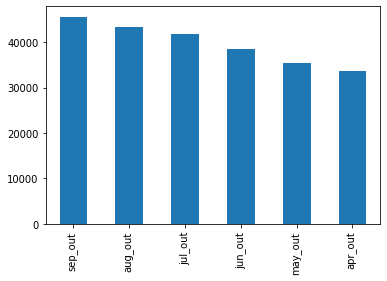

In [20]:
# Let's calculate mean of outstanding amount for each month.
df_mean = df.iloc[:,25:31].mean()
df_mean.plot(kind='bar')

So we can say outstanding amount trend is increasing from april to september. That means bank is going into loss.

### b. Number of Customers with outstanding amount (In differant outstanding amount bucket)

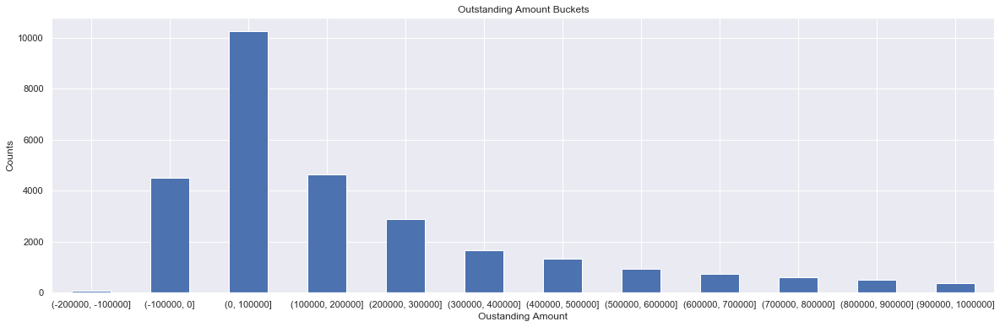

In [21]:
sns.set(style='darkgrid')
plt.figure(figsize=(20,6))
out = pd.cut(df['total_out'],
             bins=[-200000,-100000,0,100000,200000,300000,400000,500000,600000,700000,800000,900000,1000000])
ax = out.value_counts(sort=False).plot.bar(rot=0,color='b')
plt.title('Outstanding Amount Buckets')
plt.xlabel('Oustanding Amount')
plt.ylabel('Counts')
plt.show()

## 2. Relation Between Outstanding Amount and Age, Sex, Education, Credit Limit and Marriage.

The unpaid amount to bank in september month is Outstanding Amount.

C:\Users\rushikesh\anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


([<matplotlib.patches.Wedge at 0x1a846177b48>,
 [Text(1.2999999801138054, 0.00022738536863962632, 'other1'),
  Text(0.5491465117354545, 0.9531201963282399, 'grduate school'),
  Text(-0.9604588834046393, -0.5362077333357976, 'university'),
  Text(1.0724753755874437, -0.7347084923686209, 'high school'),
  Text(1.093089754887896, -0.12310478365652369, 'other'),
  Text(1.0981946045896847, -0.06299690825831132, 'other2'),
  Text(1.099972723991326, -0.007746384647207098, 'other4')],
 [Text(0.7999999877623417, 0.00013992945762438542, '0.01'),
  Text(0.2995344609466115, 0.5198837434517671, '33.35'),
  Text(-0.5238866636752577, -0.2924769454558896, '49.50'),
  Text(0.6599848465153498, -0.4521283029960743, '15.18'),
  Text(0.5962307753933977, -0.06714806381264928, '0.37'),
  Text(0.5990152388671007, -0.0343619499590789, '1.38'),
  Text(0.5999851221770868, -0.004225300716658416, '0.22')])

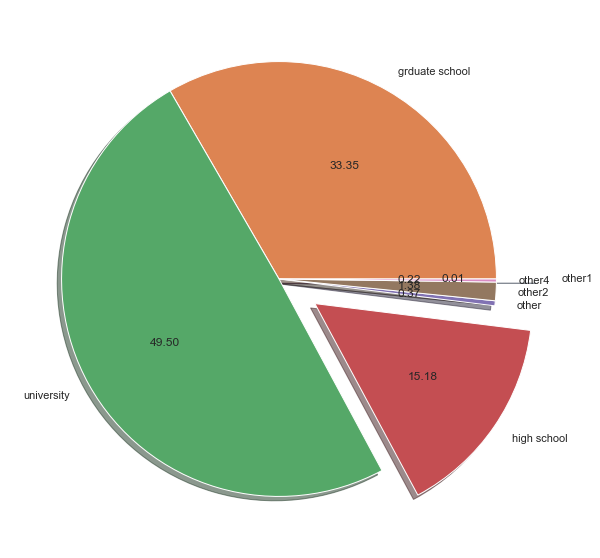

In [22]:
plt.figure(figsize=(10,10))
total_ed = df[['EDUCATION','total_out']]
total_ed = total_ed.groupby(['EDUCATION']).sum()
plt.pie(total_ed,labels=['other1','grduate school','university','high school','other','other2','other4'],
        explode=[0.2,0,0,0.2,0,0,0],labeldistance=1.1,autopct='%.2f',shadow=True)

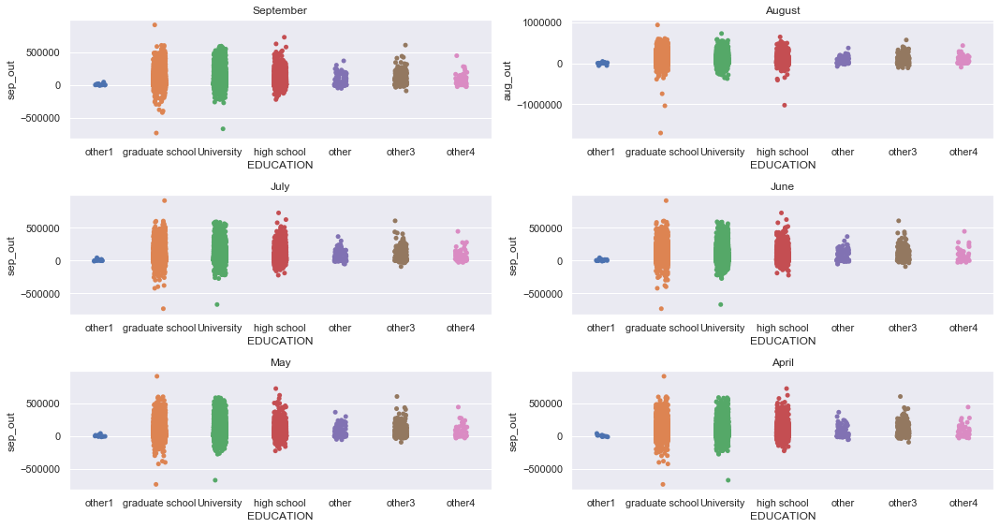

In [23]:
plt.figure(figsize=(15,8))
plt.subplot(321)
plt.title('September')
g = sns.stripplot(df['EDUCATION'],df['sep_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])


plt.subplot(322)
plt.title('August')
g = sns.stripplot(df['EDUCATION'],df['aug_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(323)
plt.title('July')
g = sns.stripplot(df['EDUCATION'],df['sep_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])


plt.subplot(324)
plt.title('June')
g = sns.stripplot(df['EDUCATION'],df['sep_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(325)
plt.title('May')
g = sns.stripplot(df['EDUCATION'],df['sep_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(326)
plt.title('April')
g = sns.stripplot(df['EDUCATION'],df['sep_out'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.tight_layout()

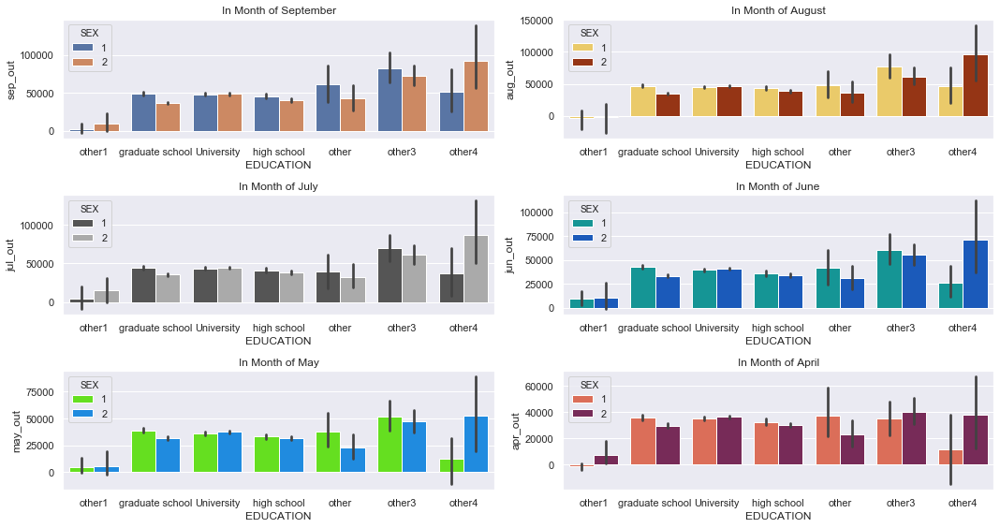

In [24]:
# Relation between Gender,Education and Outstanding Amount.
sns.set(style='darkgrid')
plt.figure(figsize=(15,8))
plt.subplot(321)
plt.title('In Month of September')
g = sns.barplot(x=df['EDUCATION'],y=df['sep_out'],hue=df['SEX'])
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(322)
plt.title('In Month of August')
g = sns.barplot(x=df['EDUCATION'],y=df['aug_out'],hue=df['SEX'],palette='afmhot_r')
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(323)
plt.title('In Month of July')
g = sns.barplot(x=df['EDUCATION'],y=df['jul_out'],hue=df['SEX'],palette='binary_r')
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(324)
plt.title('In Month of June')
g = sns.barplot(x=df['EDUCATION'],y=df['jun_out'],hue=df['SEX'],palette='winter_r')
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(325)
plt.title('In Month of May')
g = sns.barplot(x=df['EDUCATION'],y=df['may_out'],hue=df['SEX'],palette='gist_rainbow')
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])

plt.subplot(326)
plt.title('In Month of April')
g = sns.barplot(x=df['EDUCATION'],y=df['apr_out'],hue=df['SEX'],palette='rocket_r')
g.set_xticklabels(['other1','graduate school','University','high school','other','other3','other4'])
plt.tight_layout()

from above plot we see customers with other4 types of education has higher oustanding amount than the other customers.

C:\Users\rushikesh\anaconda3\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  after removing the cwd from sys.path.


([<matplotlib.patches.Wedge at 0x1a846f17b88>,
 [Text(1.3999964151830846, 0.003168197360102123, 'other1'),
  Text(0.086627424057157, 1.096583644507441, 'married'),
  Text(-0.11624475562953551, -1.0938405536405338, 'single'),
  Text(1.199631653838264, -0.02973037351382448, 'other')],
 [Text(0.8999976954748399, 0.0020366983029227927, '0.07'),
  Text(0.04725132221299472, 0.598136533367695, '47.35'),
  Text(-0.063406230343383, -0.5966403019857457, '51.79'),
  Text(0.699785131405654, -0.017342717883064282, '0.79')])

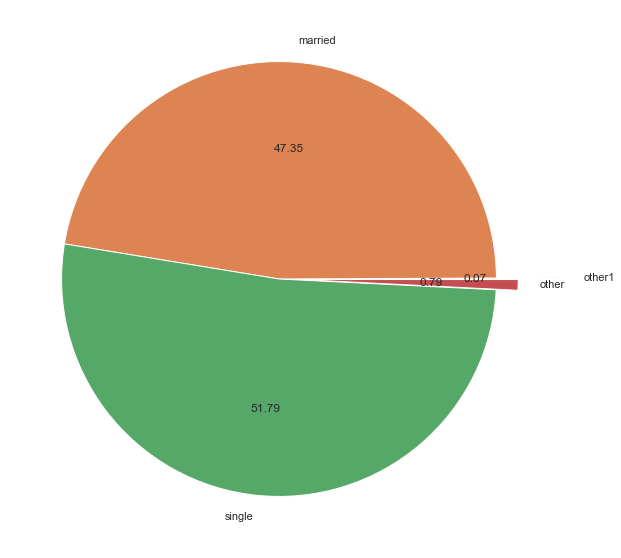

In [25]:
total_mr = df[['MARRIAGE','total_out']]
total_mr = total_mr.groupby(['MARRIAGE']).sum()
plt.figure(figsize=(10,10))
plt.pie(total_mr,labels=['other1','married','single','other'],autopct='%.2f',explode=[0.3,0,0,0.1])

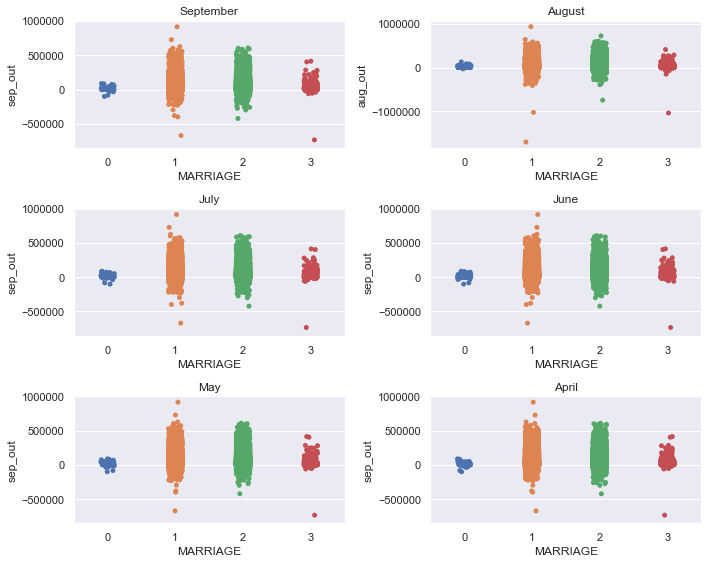

In [26]:
plt.figure(figsize=(10,8))
plt.subplot(321)
plt.title('September')
sns.stripplot(df['MARRIAGE'],df['sep_out'])

plt.subplot(322)
plt.title('August')
sns.stripplot(df['MARRIAGE'],df['aug_out'])

plt.subplot(323)
plt.title('July')
sns.stripplot(df['MARRIAGE'],df['sep_out'])


plt.subplot(324)
plt.title('June')
sns.stripplot(df['MARRIAGE'],df['sep_out'])

plt.subplot(325)
plt.title('May')
sns.stripplot(df['MARRIAGE'],df['sep_out'])

plt.subplot(326)
plt.title('April')
sns.stripplot(df['MARRIAGE'],df['sep_out'])
plt.tight_layout()

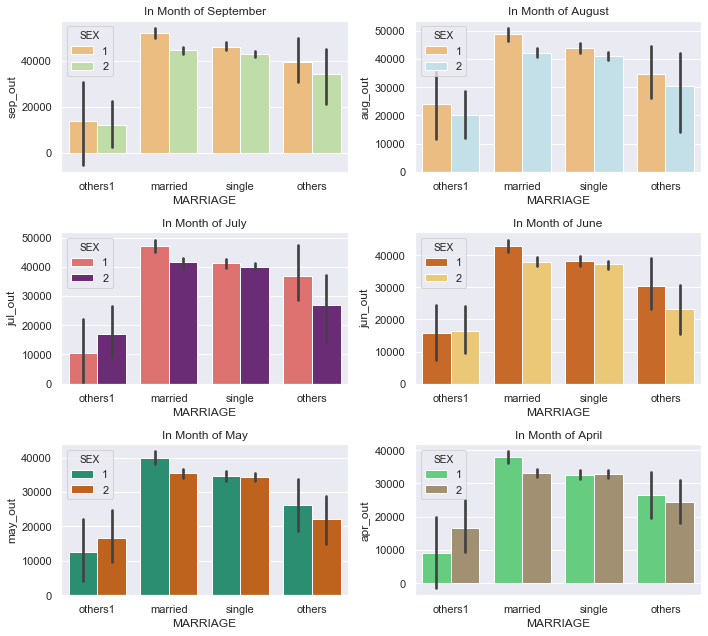

In [27]:
# Relation between marriage and outstanding amount.
plt.figure(figsize=(10,9))

plt.subplot(321)
plt.title('In Month of September')
g = sns.barplot(x=df['MARRIAGE'],y=df['sep_out'],hue=df['SEX'],palette='Spectral')
g.set_xticklabels(['others1','married','single','others'])

plt.subplot(322)
plt.title('In Month of August')
g = sns.barplot(x=df['MARRIAGE'],y=df['aug_out'],hue=df['SEX'],palette='RdYlBu')
g.set_xticklabels(['others1','married','single','others'])

plt.subplot(323)
plt.title('In Month of July')
g = sns.barplot(x=df['MARRIAGE'],y=df['jul_out'],hue=df['SEX'],palette='magma_r')
g.set_xticklabels(['others1','married','single','others'])

plt.subplot(324)
plt.title('In Month of June')
g = sns.barplot(x=df['MARRIAGE'],y=df['jun_out'],hue=df['SEX'],palette='YlOrBr_r')
g.set_xticklabels(['others1','married','single','others'])

plt.subplot(325)
plt.title('In Month of May')
g = sns.barplot(x=df['MARRIAGE'],y=df['may_out'],hue=df['SEX'],palette='Dark2')
g.set_xticklabels(['others1','married','single','others'])

plt.subplot(326)
plt.title('In Month of April')
g = sns.barplot(x=df['MARRIAGE'],y=df['apr_out'],hue=df['SEX'],palette='terrain')
g.set_xticklabels(['others1','married','single','others'])
plt.tight_layout()

from above plots we can see married customers have higher oustanding amount in which male customers dominating over female customers.

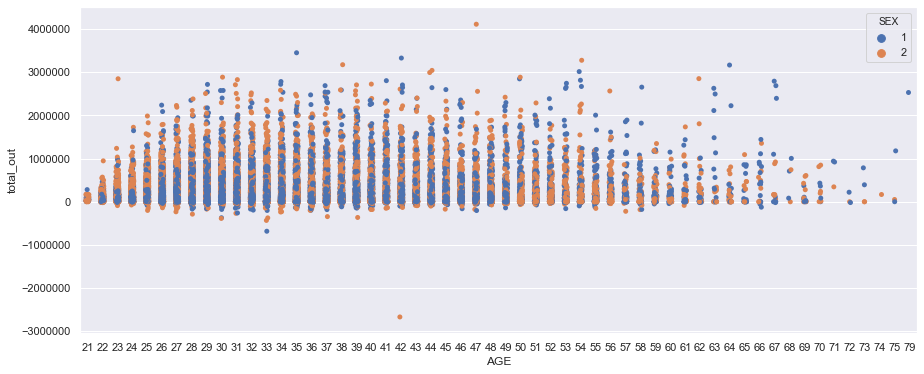

In [28]:
plt.figure(figsize=(15,6))

sns.stripplot(df['AGE'],df['total_out'],hue=df['SEX'])

In [29]:
df['SEX'].value_counts()

2    18112
1    11888
Name: SEX, dtype: int64

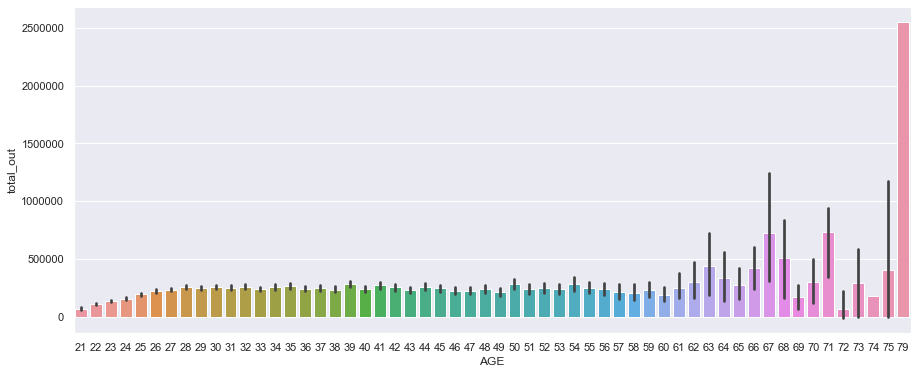

In [30]:
plt.figure(figsize=(15,6))
sns.barplot(x=df['AGE'],y=df['total_out'])

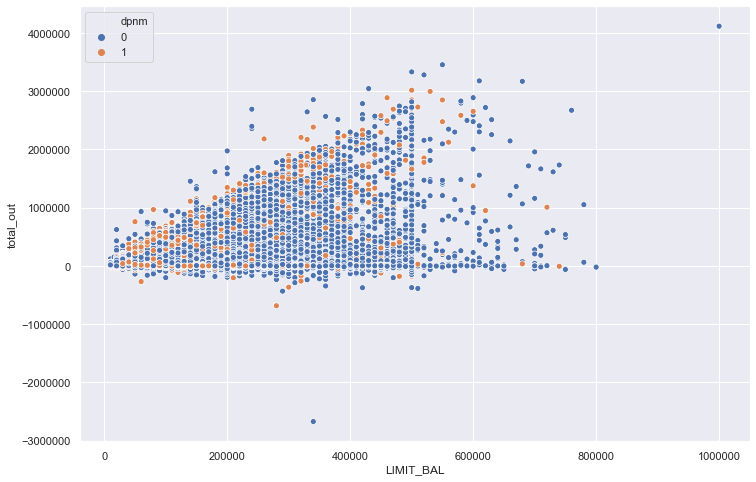

In [31]:
plt.figure(figsize=(12,8))
sns.scatterplot(x=df['LIMIT_BAL'],y=df['total_out'],hue=df['dpnm'])

## 3. Oustanding amount affect on default behaviour in next month

In [32]:
df['dpnm'].value_counts()

0    23364
1     6636
Name: dpnm, dtype: int64

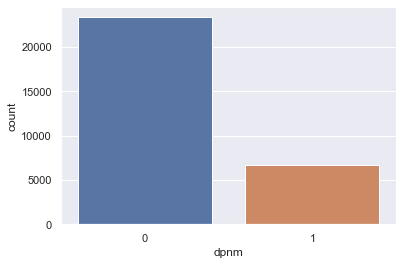

In [33]:
sns.countplot(x=df['dpnm'])

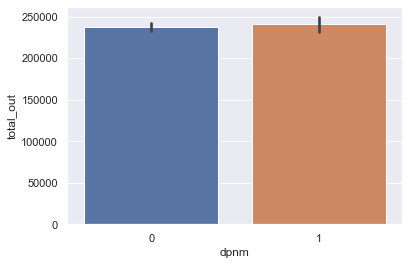

In [32]:
sns.barplot(x=df['dpnm'],y=df['total_out'])

Text(0, 0.5, 'Density')

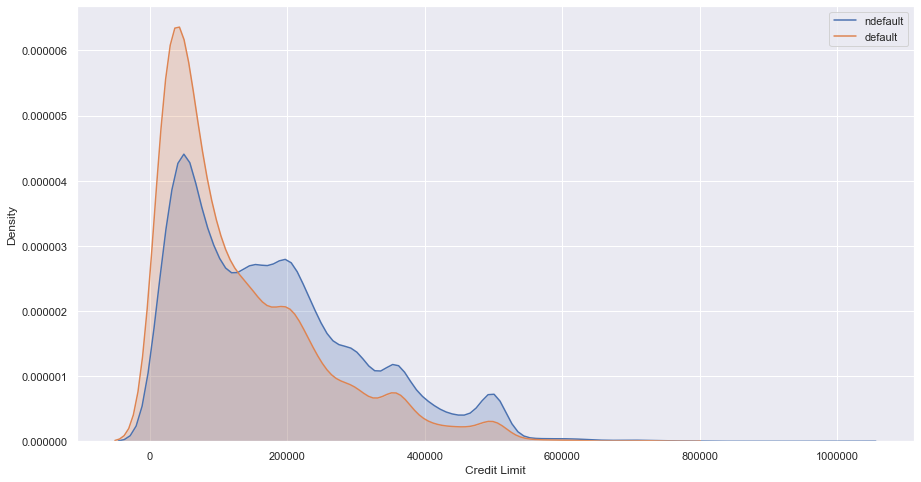

In [59]:
ndefault = df.query('dpnm == 0')
default = df.query('dpnm == 1')
plt.figure(figsize=(15,8))
ax = sns.kdeplot(ndefault.LIMIT_BAL,shade=True,label='ndefault')
ax = sns.kdeplot(default.LIMIT_BAL, shade=True, label='default')
plt.xlabel('Credit Limit')
plt.ylabel('Density')

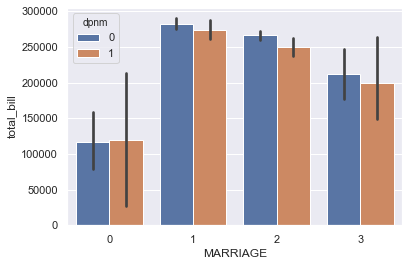

In [38]:
sns.barplot(df['MARRIAGE'],df['total_bill'],hue=df['dpnm'])

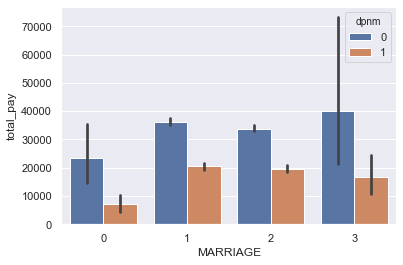

In [39]:
sns.barplot(df['MARRIAGE'],df['total_pay'],hue=df['dpnm'])

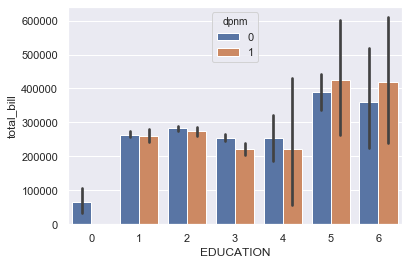

In [40]:
sns.barplot(df['EDUCATION'],df['total_bill'],hue=df['dpnm'])

In [41]:
pd.pivot_table(df,index=['dpnm','EDUCATION','MARRIAGE'],values=['total_bill','total_pay','total_out'])

total_bill      total_out      total_pay
dpnm EDUCATION MARRIAGE                                             
0    0         1          94388.250000   67022.250000   27366.000000
               2          53792.500000   12979.000000   40813.500000
     1         0          90253.000000   54904.250000   35348.750000
               1         278936.874365  230535.849306   48401.025059
               2         257040.961296  218490.777498   38550.183798
               3         245009.594595  108716.189189  136293.405405
     2         0         201298.000000  181055.600000   20242.400000
               1         288373.141422  255764.308926   32608.832496
               2         278159.180522  248349.289206   29809.891316
               3         206172.584746  181980.805085   24191.779661
     3         0         109101.900000   86608.000000   22493.900000
               1         262398.427622  234759.384433   27639.043189
               2         249942.205903  219886.546328   30055.659574
               3         192263.723684  174578.776316   17684.947368
     4         1         239135.265306  204693.775510   34441.489796
               2         276415.015625  234143.531250   42271.484375
               3          33165.666667    6114.000000   27051.666667
     5         1         433669.028369  388256.751773   45412.276596
               2         334232.415254  300626.872881   33605.542373
               3         414229.000000  388340.000000   25889.000000
     6         1         349560.652174  303567.565217   45993.086957
               2         346646.777778  286747.722222   59899.055556
               3         599995.500000  509994.000000   90001.500000
1    1         1         281147.331599  254732.000000   26415.331599
               2         246569.236045  225861.389155   20707.846890
               3         468025.307692  422657.615385   45367.692308
     2         0          12590.000000   10239.000000    2351.000000
               1         284713.932173  265581.046819   19132.885354
               2         266908.593576  247316.730698   19591.862878
               3         163665.250000  151194.863636   12470.386364
     3         0         145626.250000  137071.000000    8555.250000
               1         238505.167109  221843.881963   16661.285146
               2         197273.931416  181183.077434   16090.853982
               3         130307.037037  120324.000000    9983.037037
     4         1         263073.333333  232471.333333   30602.000000
               2         189262.500000  181393.000000    7869.500000
     5         1         543833.888889  488941.000000   54892.888889
               2         307137.000000  280307.333333   26829.666667
     6         1         368932.400000  309208.000000   59724.400000
               2         504407.000000  436768.666667   67638.333333

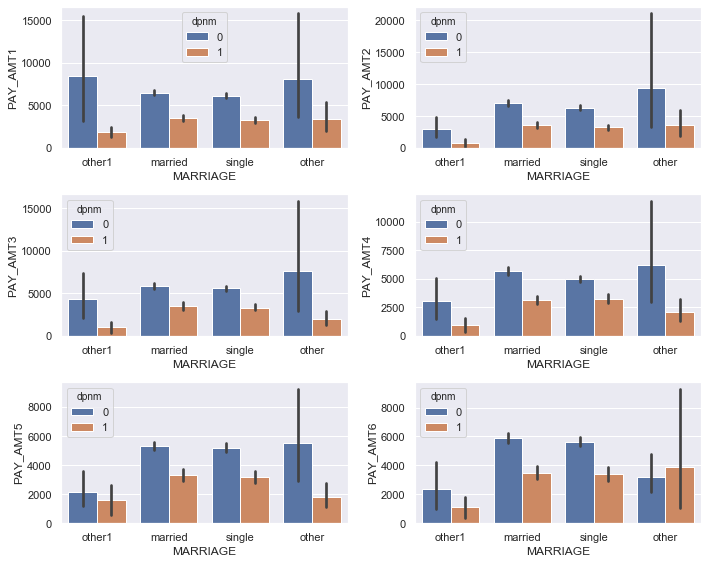

In [42]:
plt.figure(figsize=(10,8))
plt.subplot(321)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT1'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(322)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT2'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(323)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT3'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(324)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT4'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(325)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT5'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(326)
g = sns.barplot(x=df['MARRIAGE'],y=df['PAY_AMT6'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])
plt.tight_layout()

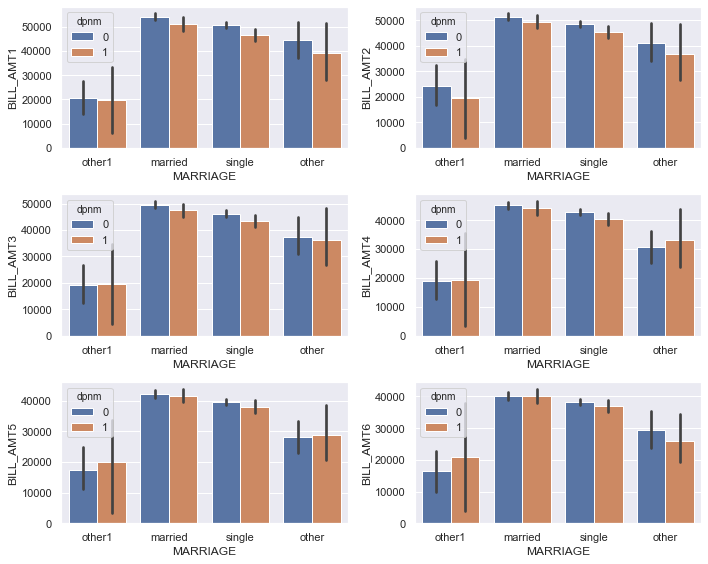

In [43]:
plt.figure(figsize=(10,8))
plt.subplot(321)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT1'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(322)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT2'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(323)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT3'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(324)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT4'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(325)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT5'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])

plt.subplot(326)
g = sns.barplot(x=df['MARRIAGE'],y=df['BILL_AMT6'],hue=df['dpnm'])
g.set_xticklabels(['other1','married','single','other'])
plt.tight_layout()

Text(0, 0.5, 'Density')

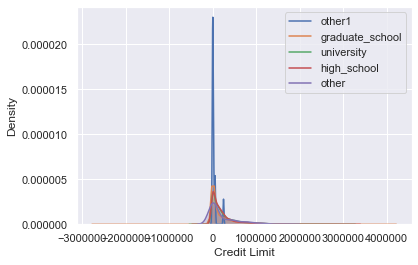

In [60]:
other1 = df.query('EDUCATION == 0')
graduate_school = df.query('EDUCATION == 1')
university = df.query('EDUCATION == 2')
high_school = df.query('EDUCATION == 3')
others = df.query('EDUCATION == 4')

f, ax = plt.subplots()


ax = sns.kdeplot(other1.total_out, shade=True, label='other1')
ax = sns.kdeplot(graduate_school.total_out, shade=True, label='graduate_school')
ax = sns.kdeplot(university.total_out, shade=True, label='university')
ax = sns.kdeplot(high_school.total_out, shade = True, label='high_school')
ax = sns.kdeplot(others.total_out,shade=True, label='other')
plt.xlabel('Credit Limit')
plt.ylabel('Density')



Text(0, 0.5, 'Density')

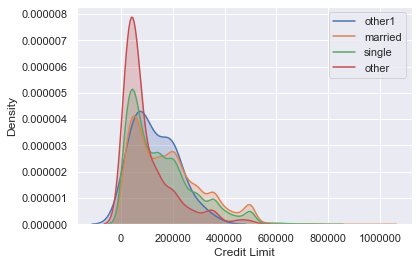

In [45]:
other1 = df.query('MARRIAGE == 0')
married = df.query('MARRIAGE == 1')
single = df.query('MARRIAGE == 2')
other = df.query('MARRIAGE == 3')

f, ax = plt.subplots()


ax = sns.kdeplot(other1.LIMIT_BAL, shade=True, label='other1')
ax = sns.kdeplot(married.LIMIT_BAL, shade=True, label='married')
ax = sns.kdeplot(single.LIMIT_BAL, shade=True, label='single')
ax = sns.kdeplot(other.LIMIT_BAL, shade = True, label='other')

plt.xlabel('Credit Limit')
plt.ylabel('Density')

## 4. Let's check error in dataset

In [46]:
df['MARRIAGE'].value_counts()

2    15964
1    13659
3      323
0       54
Name: MARRIAGE, dtype: int64

In [47]:
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In marriage column we have unknown value that is 0. Also in Education we have three unknown values 0,5,6.

## 5. Let's Check the normal distribustion for differant columns.

- Skewness
 - If skewness is less than -1 or greater than 1, the distribution is highly skewed.
 - If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed.
 - If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.
- Kurtosis
 - Kurtosis of the normal distribution is 3.0
 - K < 3 indicates a platykurtic distribution.
 - K > 3 indicates a leptokurtic distribution.

skewness of data is: 0.992866960519544
kurtosis of data is: 0.536262896398668


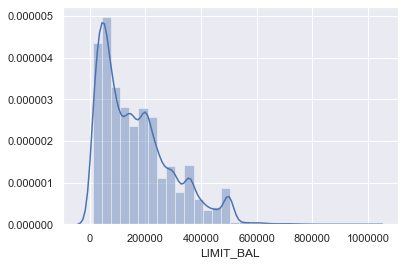

In [48]:
sns.distplot(df['LIMIT_BAL'],hist=True,bins=30)
print('skewness of data is:',df['LIMIT_BAL'].skew())
print('kurtosis of data is:',df['LIMIT_BAL'].kurtosis())

From above plot of credit limit we can see that this distribution is positively skewed. Most of the values of credit limit lies in the interval of 10000 to 200000. Above 200000 it is decreasing.

Oustanding amount data is positively skewed.

skewness of data is: 0.7322458687830562
kurtosis of data is: 0.04430337823580954


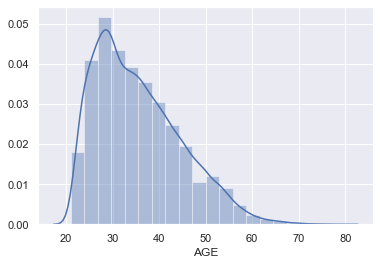

In [49]:
sns.distplot(df['AGE'],hist=True,bins=20)
print('skewness of data is:',df['AGE'].skew())
print('kurtosis of data is:',df['AGE'].kurtosis())

Most of the customers age lies in the interval of 25 to 40. The distribution is positively skewed.

skewness is: 2.686375400987309
kurtosis is: 10.125759379478973


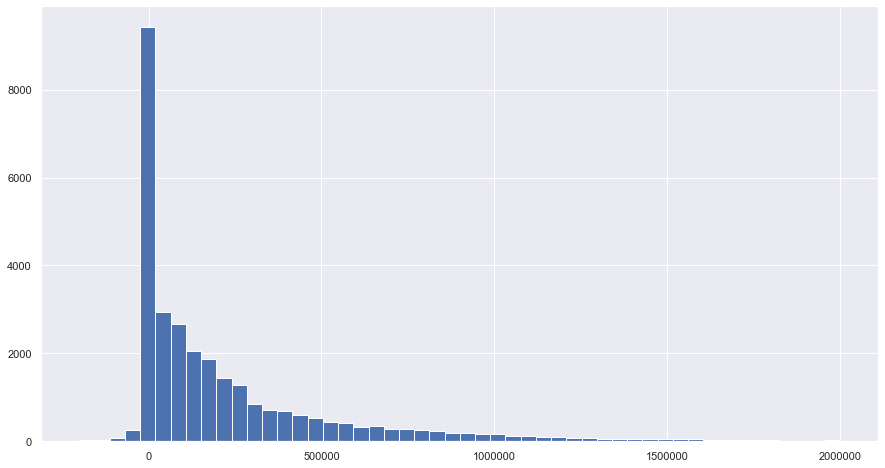

In [50]:
plt.figure(figsize=(15,8))
plt.hist(df['total_out'],bins=50,range=[-200000,2000000])
print('skewness is:',df['total_out'].skew())
print('kurtosis is:',df['total_out'].kurtosis())

skewness is: 2.734743901741407
kurtosis is: 10.524208120035146


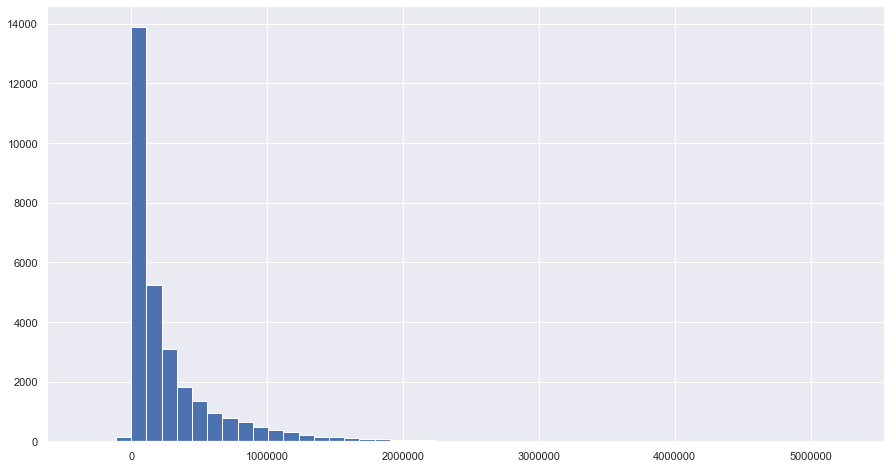

In [51]:
plt.figure(figsize=(15,8))
plt.hist(df['total_bill'],bins=50)
print('skewness is:',df['total_bill'].skew())
print('kurtosis is:',df['total_bill'].kurtosis())

skewness is: 14.616877230600915
kurtosis is: 607.756083223564


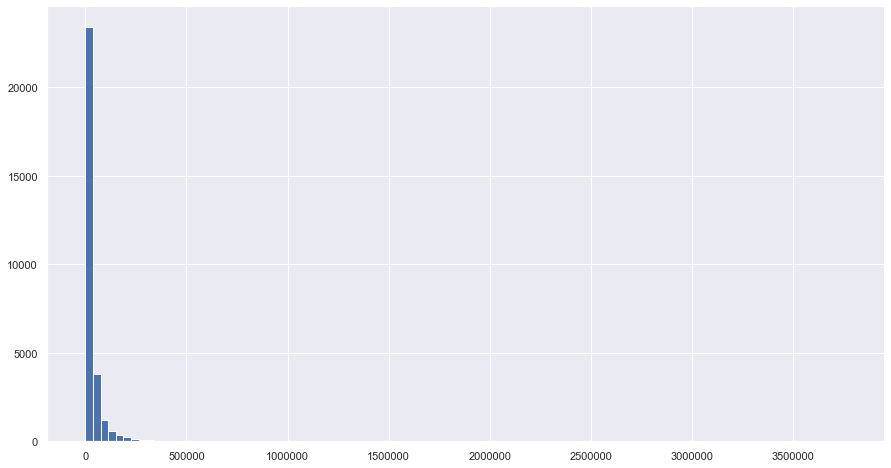

In [52]:
plt.figure(figsize=(15,8))
plt.hist(df['total_pay'],bins=100)
print('skewness is:',df['total_pay'].skew())
print('kurtosis is:',df['total_pay'].kurtosis())

In [53]:
df['total_out'].value_counts()

0         1402
390         69
2500        33
14400       29
1170        25
          ... 
145906       1
66037        1
397815       1
92664        1
198673       1
Name: total_out, Length: 26317, dtype: int64

## 6. Finding the Outliers

In [54]:
# Plot the box plot of credit limit.
#sns.boxplot(df['LIMIT_BAL'])
Q1 = df['AGE'].quantile(0.25)
Q3 = df['AGE'].quantile(0.75)
IQR = Q3-Q1
print(Q1)
print(Q3)
print(IQR)

28.0
41.0
13.0


In [55]:
outliers=[]
def detect_outlier(data):
    
    threshold=3
    mean_1 = np.mean(data)
    std_1 =np.std(data)
    
    
    for y in data:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y)
    return len(outliers)

In [56]:
detect_outlier(df['AGE'])

141

In [57]:
detect_outlier(df['total_out'])

799

In [58]:
px.box(df['LIMIT_BAL'])

In [56]:
px.box(df,df['total_out'])